In [185]:
import pandas as pd 
df = pd.read_parquet("/Users/melina/Downloads/initial_run_cleaned.parquet")

df.head()

,university,program,cleaned_degree,date_posted,cleaned_status,admission_term,admission_year,result,result_day,result_month,...,GRE_Total,notes_raw,degree,decision_raw,season,status,score1_raw,score2_raw,score3_raw,score4_raw
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,Fall,2020.0,Accepted,11,Jul,...,NaN,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 11 Jul\t\t\t\t\t...,Fall 2026,International,GPA 3.0,None,None,None
1,University of Auckland,Geography,Masters,2025-07-10,International,Spring,2020.0,Accepted,10,Jul,...,NaN,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Spring 2026,International,GPA 3.33,None,None,None
2,University of Arizona,Computer Science,Masters,2025-07-10,American,Fall,2020.0,Accepted,10,Jul,...,170.0,This is not a real application. I am using thi...,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Fall 2026,American,GRE 170,GRE V 170,GRE AW 36,GPA 3.85
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,Fall,2020.0,Rejected,10,Jul,...,NaN,None,Masters,\n\t\t\t\t\t\t\t\tRejected on 10 Jul\t\t\t\t\t...,Fall 2025,American,None,None,None,None
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,Fall,2020.0,Accepted,9,Jul,...,NaN,Automatic acceptance,Masters,\n\t\t\t\t\t\t\t\tAccepted on 9 Jul\t\t\t\t\t\t\t,Fall 2025,International,None,None,None,None


In [186]:
missing_dates = df['date_posted'].isna().sum()
total = len(df)
percent_missing = (missing_dates / total) * 100

print(f"Number of missing/null values in 'date_posted': {missing_dates}")
print(f"Percentage of missing 'date_posted': {percent_missing:.2f}%")


Number of missing/null values in 'date_posted': 1
Percentage of missing 'date_posted': 0.00%


In [187]:
import pandas as pd
from tabulate import tabulate

df['date_posted'] = pd.to_datetime(df['date_posted'], errors='coerce')

years = df['date_posted'].dropna().dt.year

all_years = range(years.min(), years.max() + 1)

counts_per_year = years.value_counts().sort_index()

missing_years = [year for year in all_years if year not in counts_per_year.index]

threshold = 10
few_entries_years = counts_per_year[counts_per_year < threshold].index.tolist()

summary = pd.DataFrame({'Year': list(all_years)})
summary['Entries'] = summary['Year'].map(counts_per_year).fillna(0).astype(int)

print("Yearly entries summary (including missing years):")
print(tabulate(summary, headers='keys', tablefmt='grid', showindex=False))


Yearly entries summary (including missing years):
+--------+-----------+
|   Year |   Entries |
+========+===========+
|   2001 |     60150 |
+--------+-----------+
|   2002 |         0 |
+--------+-----------+
|   2003 |         0 |
+--------+-----------+
|   2004 |         0 |
+--------+-----------+
|   2005 |         0 |
+--------+-----------+
|   2006 |        84 |
+--------+-----------+
|   2007 |      1000 |
+--------+-----------+
|   2008 |      3996 |
+--------+-----------+
|   2009 |      4000 |
+--------+-----------+
|   2010 |     17144 |
+--------+-----------+
|   2011 |      6842 |
+--------+-----------+
|   2012 |     15994 |
+--------+-----------+
|   2013 |     13986 |
+--------+-----------+
|   2014 |     16487 |
+--------+-----------+
|   2015 |         0 |
+--------+-----------+
|   2016 |         0 |
+--------+-----------+
|   2017 |         0 |
+--------+-----------+
|   2018 |         0 |
+--------+-----------+
|   2019 |         2 |
+--------+-----------+
|   202

In [188]:
print("\nYears with no data:", missing_years)
print(f"Years with fewer than {threshold} entries:", few_entries_years)



Years with no data: [2002, 2003, 2004, 2005, 2015, 2016, 2017, 2018]
Years with fewer than 10 entries: [2019]


Due to the absence of available data on the GradCafe platform between 2014 and 2020, and the presence of anomalies or sparsity in earlier years, we restrict our analysis to data from 2020 onwards. 

In [189]:
import pandas as pd
import numpy as np
from tabulate import tabulate
from scipy.stats import entropy

df['year'] = pd.to_datetime(df['date_posted'], errors='coerce').dt.year
df_filtered = df[df['year'] >= 2020].copy()

year_counts = df_filtered['year'].value_counts().sort_index()
years = year_counts.index
counts = year_counts.values

growth_rate = year_counts.pct_change() * 100
growth_rate.fillna(0, inplace=True)

cumulative_counts = year_counts.cumsum()
cumulative_percentage = cumulative_counts / cumulative_counts.iloc[-1] * 100

prob_dist = counts / counts.sum()
yearly_entropy = entropy(prob_dist, base=2)

def gini(array):
    sorted_array = np.sort(array)
    n = len(array)
    return np.abs(np.subtract.outer(sorted_array, sorted_array)).sum() / (2 * n * np.sum(sorted_array))

gini_value = gini(counts)

summary_df = pd.DataFrame({
    "Year": year_counts.index,
    "Entries": year_counts.values,
    "Growth (%)": growth_rate.round(2).values,
    "Cumulative (%)": cumulative_percentage.round(2).values
})

print(tabulate(summary_df, headers='keys', tablefmt='pretty', showindex=False))

print(f"\nEntropy: {yearly_entropy:.4f}")
print(f"Gini Coefficient: {gini_value:.4f}")


+--------+---------+------------+----------------+
|  Year  | Entries | Growth (%) | Cumulative (%) |
+--------+---------+------------+----------------+
| 2020.0 | 6000.0  |    0.0     |      15.0      |
| 2021.0 | 11497.0 |   91.62    |     43.75      |
| 2022.0 | 6926.0  |   -39.76   |     61.07      |
| 2023.0 | 4563.0  |   -34.12   |     72.48      |
| 2024.0 | 4498.0  |   -1.42    |     83.72      |
| 2025.0 | 6509.0  |   44.71    |     100.0      |
+--------+---------+------------+----------------+

Entropy: 2.5038
Gini Coefficient: 0.1775


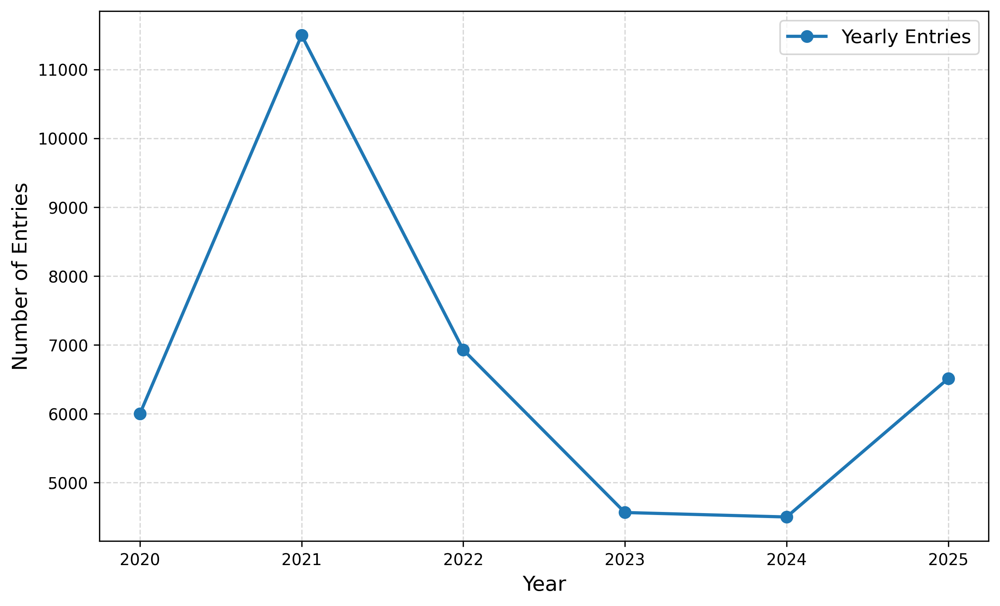

Figure saved at: ./gradcafe_entries_dual_blue.pdf


In [190]:
import matplotlib.pyplot as plt
import pandas as pd

rolling_avg = year_counts.rolling(window=3, center=True).mean()

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

academic_blue = '#1f77b4' 
deep_blue = '#0d3b66'    

ax.plot(years, counts, marker='o', color=academic_blue,
        linewidth=2, markersize=7, label='Yearly Entries')

ax.set_xlabel('Year', fontsize=13)
ax.set_ylabel('Number of Entries', fontsize=13)

ax.grid(True, linestyle='--', alpha=0.5)

ax.legend(fontsize=12)

output_path = "./gradcafe_entries_dual_blue.pdf"
plt.savefig(output_path, format='pdf', bbox_inches='tight')

plt.show()

print(f"Figure saved at: {output_path}")


In [191]:

df['date_posted'] = pd.to_datetime(df['date_posted'], errors='coerce')

df_since_2021 = df[df['date_posted'].dt.year >= 2021]

count_since_2021 = len(df_since_2021)
print(f"Number of entries since 2021: {count_since_2021}")


Number of entries since 2021: 33993


In [192]:

df['date_posted'] = pd.to_datetime(df['date_posted'], errors='coerce')

total_entries = len(df)

df_since_2020 = df[df['date_posted'].dt.year >= 2020]
entries_since_2020 = len(df_since_2020)

df_since_2021 = df[df['date_posted'].dt.year >= 2021]
entries_since_2021 = len(df_since_2021)

percent_of_total = (entries_since_2021 / total_entries) * 100
percent_of_since_2020 = (entries_since_2021 / entries_since_2020) * 100

print(f"Entries from 2021 onward: {entries_since_2021}")
print(f"- As % of total dataset: {percent_of_total:.2f}%")
print(f"- As % of data since 2020: {percent_of_since_2020:.2f}%")


Entries from 2021 onward: 33993
- As % of total dataset: 18.92%
- As % of data since 2020: 85.00%


Based on the data from 2020 to 2025, the number of entries peaks sharply in 2021 with 11,497 entries, representing a 91.62% growth from 2020 and accounting for 43.75% of the cumulative total. Subsequent years show a decline in entries, with negative growth rates of -39.76% in 2022 and -34.12% in 2023, followed by a slight recovery in 2025. The entropy of 2.5038 and a low Gini coefficient of 0.1775 indicate moderate distribution inequality, with 2021 serving as a clear turning point. Therefore, this study focuses on data from 2021 onwards to leverage the peak volume and ensure analysis on a more stable and representative dataset, minimizing noise from earlier lower-entry years.



In [193]:
df_since_2021 = df_since_2021.reset_index().rename(columns={'index': 'id'})
df_since_2021 = df_since_2021.set_index('id')
df_since_2021.head()

,university,program,cleaned_degree,date_posted,cleaned_status,admission_term,admission_year,result,result_day,result_month,...,notes_raw,degree,decision_raw,season,status,score1_raw,score2_raw,score3_raw,score4_raw,year
id,,,,,,,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,Fall,2020.0,Accepted,11,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 11 Jul\t\t\t\t\t...,Fall 2026,International,GPA 3.0,None,None,None,2025.0
1,University of Auckland,Geography,Masters,2025-07-10,International,Spring,2020.0,Accepted,10,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Spring 2026,International,GPA 3.33,None,None,None,2025.0
2,University of Arizona,Computer Science,Masters,2025-07-10,American,Fall,2020.0,Accepted,10,Jul,...,This is not a real application. I am using thi...,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Fall 2026,American,GRE 170,GRE V 170,GRE AW 36,GPA 3.85,2025.0
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,Fall,2020.0,Rejected,10,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tRejected on 10 Jul\t\t\t\t\t...,Fall 2025,American,None,None,None,None,2025.0
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,Fall,2020.0,Accepted,9,Jul,...,Automatic acceptance,Masters,\n\t\t\t\t\t\t\t\tAccepted on 9 Jul\t\t\t\t\t\t\t,Fall 2025,International,None,None,None,None,2025.0


In [194]:
df_since_2021.rename(columns={'result': 'Decision'}, inplace=True)
df_since_2021.rename(columns={
    'result_day': 'Decision_Day',
    'result_month': 'Decision_Month'
}, inplace=True)
df_since_2021.head()


,university,program,cleaned_degree,date_posted,cleaned_status,admission_term,admission_year,Decision,Decision_Day,Decision_Month,...,notes_raw,degree,decision_raw,season,status,score1_raw,score2_raw,score3_raw,score4_raw,year
id,,,,,,,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,Fall,2020.0,Accepted,11,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 11 Jul\t\t\t\t\t...,Fall 2026,International,GPA 3.0,None,None,None,2025.0
1,University of Auckland,Geography,Masters,2025-07-10,International,Spring,2020.0,Accepted,10,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Spring 2026,International,GPA 3.33,None,None,None,2025.0
2,University of Arizona,Computer Science,Masters,2025-07-10,American,Fall,2020.0,Accepted,10,Jul,...,This is not a real application. I am using thi...,Masters,\n\t\t\t\t\t\t\t\tAccepted on 10 Jul\t\t\t\t\t...,Fall 2026,American,GRE 170,GRE V 170,GRE AW 36,GPA 3.85,2025.0
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,Fall,2020.0,Rejected,10,Jul,...,None,Masters,\n\t\t\t\t\t\t\t\tRejected on 10 Jul\t\t\t\t\t...,Fall 2025,American,None,None,None,None,2025.0
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,Fall,2020.0,Accepted,9,Jul,...,Automatic acceptance,Masters,\n\t\t\t\t\t\t\t\tAccepted on 9 Jul\t\t\t\t\t\t\t,Fall 2025,International,None,None,None,None,2025.0


In [195]:
df_since_2021.drop(columns=['admission_year', 'degree', 'decision_raw', 'status'], inplace=True)
df_since_2021.drop(columns=['score1_raw', 'score2_raw', 'score3_raw', 'score4_raw', 'admission_term'], inplace=True)
df_since_2021.head()

,university,program,cleaned_degree,date_posted,cleaned_status,Decision,Decision_Day,Decision_Month,GPA,GRE_V,GRE_AW,GRE_Total,notes_raw,season,year
id,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,Accepted,11,Jul,3.00,NaN,NaN,NaN,None,Fall 2026,2025.0
1,University of Auckland,Geography,Masters,2025-07-10,International,Accepted,10,Jul,3.33,NaN,NaN,NaN,None,Spring 2026,2025.0
2,University of Arizona,Computer Science,Masters,2025-07-10,American,Accepted,10,Jul,3.85,170.0,36.0,170.0,This is not a real application. I am using thi...,Fall 2026,2025.0
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,Rejected,10,Jul,NaN,NaN,NaN,NaN,None,Fall 2025,2025.0
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,Accepted,9,Jul,NaN,NaN,NaN,NaN,Automatic acceptance,Fall 2025,2025.0


In [196]:
import pandas as pd

count_interviewed = (df_since_2021['Decision'] == 'Interview').sum()

print(f"Number of cases where decision is 'interview': {count_interviewed}")


Number of cases where decision is 'interview': 5014


displaying note colomn where Decision is interview to find a method to extract the result of interview afterwards.

In [197]:
from tabulate import tabulate
import pandas as pd

df_since_2021['Decision'] = df_since_2021['Decision'].astype(str).str.strip().str.lower()

interview_mask = df_since_2021['Decision'] == 'interview'

interview_notes_only = df_since_2021.loc[interview_mask, ['Decision', 'notes_raw']].copy()

interview_notes_only['Decision'] = interview_notes_only['Decision'].str.capitalize()

print(tabulate(interview_notes_only[['Decision', 'notes_raw']], headers=['Decision', 'Notes Raw'], tablefmt='grid', showindex=False))


+------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Deci

Contrary to our initial assumption, the interview notes do not reveal definitive outcomes, making it impossible to determine the final results of the interviews.





We evaluated multiple methods to match and enrich university data. Using the OpenAlex API alone, 1,142 out of 1,887 universities (60.57%) were matched with location data (city and country). Fuzzy matching with the Webometrics dataset yielded 821 matches (43.51%) with rank information. These initial results provided a baseline for comparison in assessing the accuracy and coverage of different enrichment strategies.

To improve the accuracy of university name matching between TheGradCafe dataset and the QS World University Rankings, we utilized the OpenAlex API to extract alternative and commonly used university names.

In [198]:
import pandas as pd
import re
import aiohttp
import asyncio
import nest_asyncio
from tabulate import tabulate

nest_asyncio.apply()

df_filtered['date_posted'] = pd.to_datetime(df_filtered['date_posted'], errors='coerce')
df_filtered_recent = df_filtered[df_filtered['date_posted'].dt.year >= 2021]

def clean_name(name):
    if not isinstance(name, str):
        return ''
    name = name.strip()
    name = re.sub(r'\s+', ' ', name)
    name = re.sub(r'[^\w\s]', '', name)
    return name.lower()

unique_universities = df_filtered_recent['university'].drop_duplicates().reset_index(drop=True)
tokenized_df = pd.DataFrame({
    'university': unique_universities,
    'university_cleaned': unique_universities.apply(clean_name)
})

async def fetch_name_info(session, name):
    url = f"https://api.openalex.org/institutions?search=\"{name}\""
    try:
        async with session.get(url) as response:
            response.raise_for_status()
            data = await response.json()
            results = data.get('results', [])
            if results:
                inst = results[0]
                return {
                    'display_name': inst.get('display_name'),
                    'display_name_acronyms': inst.get('display_name_acronyms', []),
                    'display_name_alternatives': inst.get('display_name_alternatives', [])
                }
            else:
                return None
    except Exception:
        return None

async def gather_name_info(names):
    semaphore = asyncio.Semaphore(20)
    async with aiohttp.ClientSession() as session:
        async def sem_fetch(name):
            async with semaphore:
                return await fetch_name_info(session, name)
        tasks = [sem_fetch(name) for name in names]
        return await asyncio.gather(*tasks)

unique_cleaned_names = tokenized_df['university_cleaned'].unique().tolist()
name_info_list = asyncio.get_event_loop().run_until_complete(
    gather_name_info(unique_cleaned_names)
)

name_to_info = dict(zip(unique_cleaned_names, name_info_list))
tokenized_df['name_info'] = tokenized_df['university_cleaned'].map(name_to_info)

name_info_df = pd.json_normalize(tokenized_df['name_info'])
tokenized_df = pd.concat([tokenized_df, name_info_df], axis=1)

print(tabulate(
    tokenized_df[['university', 'university_cleaned', 'display_name', 'display_name_acronyms', 'display_name_alternatives']],
    headers='keys',
    tablefmt='grid'
))


+------+----------------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------------+-------------------------------------------------------------------------------+-------------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|      | university                                                                                   | university_cleaned                                                                          | display_name                                                       

Enriched university names extracted from the OpenAlex API—including acronyms and alternative names were used to perform normalized and fuzzy matching against the QS World University Rankings. This approach aimed to improve matching accuracy and ensure consistency across datasets.


In [199]:
import pandas as pd
import os
import re
import unicodedata
from rapidfuzz import process, fuzz
from tabulate import tabulate

folder_path = '/Users/melina/Downloads'
gradcafe_path = os.path.join(folder_path, 'gradcafeuniqeuniversities.csv')
qs_path = os.path.join(folder_path, '2026 QS World University Rankings.csv')

gradcafe = pd.read_csv(gradcafe_path)
qs_rankings = pd.read_csv(qs_path, header=2)
qs_rankings.columns = qs_rankings.columns.str.strip()

stopwords = {'university', 'college', 'institute', 'of', 'the', 'and', 'at', 'for', 'campus', 'school', 'faculty'}
synonyms = {
    'polytechnic': 'technology',
    'tech': 'technology',
    'state': '',
    'national': '',
    'federal': '',
    'inst': 'institute',
    'univ': 'university',
    'dept': 'department',
    'sciences': 'science',
    'sci': 'science',
    'eng': 'engineering',
    'engg': 'engineering',
}

manual_mappings_raw = {
    'mit': 'massachusetts institute technology',
    'caltech': 'california institute technology',
    'ucla': 'university california los angeles',
    'uc berkeley': 'university california berkeley',
    'lse': 'london school economics',
    'oxford': 'university oxford',
    'cambridge': 'university cambridge',
    'harvard': 'harvard university',
    'stanford': 'stanford university',
    'yale': 'yale university',
    'columbia': 'columbia university',
}

def advanced_normalize(name):
    name = str(name).lower()
    name = unicodedata.normalize('NFKD', name).encode('ascii', 'ignore').decode('ascii')
    name = re.sub(r'[^a-z0-9 ]', ' ', name)
    name = re.sub(r'\s+', ' ', name)
    words = [w for w in name.split() if w not in stopwords]
    words = [synonyms.get(w, w) for w in words]
    words = [w for w in words if w]
    return ' '.join(words).strip()

manual_mappings = {advanced_normalize(k): advanced_normalize(v) for k, v in manual_mappings_raw.items()}

qs_rankings['Name_norm'] = qs_rankings['Name'].fillna('').apply(advanced_normalize)
qs_names_norm = qs_rankings['Name_norm'].tolist()
qs_names_set = set(qs_names_norm) 

columns_to_match = [
    'university',
    'university_cleaned',
    'display_name',
    'display_name_acronyms',
    'display_name_alternatives'
]

for col in columns_to_match:
    if col in gradcafe.columns:
        gradcafe[f'{col}_norm'] = gradcafe[col].fillna('').apply(advanced_normalize)
    else:
        print(f"Warning: Column '{col}' not found in gradcafe.")

def apply_manual_mapping(name):
    return manual_mappings.get(name, name)

def fuzzy_match_score(name, candidates):
    scorers = [fuzz.token_set_ratio, fuzz.token_sort_ratio, fuzz.partial_ratio, fuzz.ratio]
    best_score = 0
    best_match = None
    for scorer in scorers:
        match, score, _ = process.extractOne(name, candidates, scorer=scorer)
        if score > best_score:
            best_score = score
            best_match = match
    return best_match, best_score

def is_match(name, candidates, threshold=70):
    if not name:
        return False
    if name in candidates:
        return True
    _, score = fuzzy_match_score(name, candidates)
    return score >= threshold

def combined_is_match(row):
    for col in columns_to_match:
        norm_col = f'{col}_norm'
        if norm_col in gradcafe.columns:
            mapped_name = apply_manual_mapping(row[norm_col])
            if is_match(mapped_name, qs_names_set):
                return True
    return False

gradcafe['matched_in_qs'] = gradcafe.apply(combined_is_match, axis=1)

matched_count = gradcafe['matched_in_qs'].sum()
total_count = len(gradcafe)
percentage_matched = (matched_count / total_count) * 100

print(f"✅ Matched universities (maximized): {matched_count} / {total_count} ({percentage_matched:.2f}%)\n")



✅ Matched universities (maximized): 1860 / 1887 (98.57%)



This high match rate was achieved by combining the QS World University Rankings by Subject with enriched alternative university names extracted from the OpenAlex API, allowing for reliable and consistent alignment across datasets for further analysis.

In [200]:
import pandas as pd
import os
import re
import unicodedata
from rapidfuzz import process, fuzz
from tabulate import tabulate

folder_path = '/Users/melina/Downloads'
gradcafe_path = os.path.join(folder_path, 'gradcafeuniqeuniversities.csv')
qs_path = os.path.join(folder_path, '2026 QS World University Rankings.csv')

gradcafe = pd.read_csv(gradcafe_path)
qs_rankings = pd.read_csv(qs_path, header=2)
qs_rankings.columns = qs_rankings.columns.str.strip()

stopwords = {'university', 'college', 'institute', 'of', 'the', 'and', 'at', 'for', 'campus', 'school', 'faculty'}
synonyms = {
    'polytechnic': 'technology',
    'tech': 'technology',
    'state': '',
    'national': '',
    'federal': '',
    'inst': 'institute',
    'univ': 'university',
    'dept': 'department',
    'sciences': 'science',
    'sci': 'science',
    'eng': 'engineering',
    'engg': 'engineering',
}

manual_mappings_raw = {
    'mit': 'massachusetts institute technology',
    'caltech': 'california institute technology',
    'ucla': 'university california los angeles',
    'uc berkeley': 'university california berkeley',
    'lse': 'london school economics',
    'oxford': 'university oxford',
    'cambridge': 'university cambridge',
    'harvard': 'harvard university',
    'stanford': 'stanford university',
    'yale': 'yale university',
    'columbia': 'columbia university',
}

def advanced_normalize(name):
    name = str(name).lower()
    name = unicodedata.normalize('NFKD', name).encode('ascii', 'ignore').decode('ascii')
    name = re.sub(r'[^a-z0-9 ]', ' ', name)
    name = re.sub(r'\s+', ' ', name)
    words = [w for w in name.split() if w not in stopwords]
    words = [synonyms.get(w, w) for w in words]
    words = [w for w in words if w]
    return ' '.join(words).strip()

manual_mappings = {advanced_normalize(k): advanced_normalize(v) for k, v in manual_mappings_raw.items()}

qs_rankings['Name_norm'] = qs_rankings['Name'].fillna('').apply(advanced_normalize)
qs_rankings['Rank'] = qs_rankings['Rank'].fillna('').astype(str).str.strip()
qs_names_norm = qs_rankings['Name_norm'].tolist()

qs_rank_dict = dict(zip(qs_rankings['Name_norm'], qs_rankings['Rank']))

columns_to_match = [
    'university',
    'university_cleaned',
    'display_name',
    'display_name_acronyms',
    'display_name_alternatives'
]

for col in columns_to_match:
    if col in gradcafe.columns:
        gradcafe[f'{col}_norm'] = gradcafe[col].fillna('').apply(advanced_normalize)
    else:
        print(f"Warning: Column '{col}' not found in gradcafe.")

def apply_manual_mapping(name):
    return manual_mappings.get(name, name)

def fuzzy_match_score(name, candidates):
    scorers = [fuzz.token_set_ratio, fuzz.token_sort_ratio, fuzz.partial_ratio, fuzz.ratio]
    best_score = 0
    best_match = None
    for scorer in scorers:
        match, score, _ = process.extractOne(name, candidates, scorer=scorer)
        if score > best_score:
            best_score = score
            best_match = match
    return best_match, best_score

def find_best_match(name, candidates):
    if not name:
        return None, 0
    if name in candidates:
        return name, 100
    return fuzzy_match_score(name, candidates)

def combined_best_match(row):
    best_score = 0
    best_match = None
    for col in columns_to_match:
        norm_col = f'{col}_norm'
        if norm_col in gradcafe.columns:
            mapped_name = apply_manual_mapping(row[norm_col])
            match, score = find_best_match(mapped_name, qs_names_norm)
            if score > best_score:
                best_score = score
                best_match = match
    return best_match, best_score

matches = gradcafe.apply(combined_best_match, axis=1)
gradcafe['best_match'] = matches.apply(lambda x: x[0])
gradcafe['match_score'] = matches.apply(lambda x: x[1])

matched_df = gradcafe[gradcafe['match_score'] >= 70].copy()

qs_data_dict = qs_rankings.drop_duplicates(subset='Name_norm').set_index('Name_norm').to_dict(orient='index')

qs_columns_to_extract = [
    col for col in qs_rankings.columns if col not in ['Name', 'Name_norm', 'Size']
]

if 'Country/Territory' in qs_rankings.columns:
    if 'Country/Territory' not in qs_columns_to_extract:
        qs_columns_to_extract.append('Country/Territory')

for col in qs_columns_to_extract:
    matched_df[col] = matched_df['best_match'].map(lambda x: qs_data_dict.get(x, {}).get(col))

matched_df['QS_rank'] = matched_df['best_match'].map(qs_rank_dict)

selected_cols = [
    'university', 'best_match', 'QS_rank', 'match_score',
]

if 'Country/Territory' in matched_df.columns:
    selected_cols.append('Country/Territory')

selected_cols.extend([
    'Region', 'Focus', 'Research', 'Status',
    'AR SCORE', 'AR RANK',
    'ER SCORE', 'ER RANK',
    'FSR SCORE', 'FSR RANK',
    'CPF SCORE', 'CPF RANK',
    'IFR SCORE', 'IFR RANK',
    'ISR SCORE', 'ISR RANK',
    'ISD SCORE', 'ISD RANK',
    'IRN SCORE', 'IRN RANK',
    'EO SCORE', 'EO RANK',
    'SUS SCORE', 'SUS RANK',
    'Overall SCORE'
])

selected_cols = [col for col in selected_cols if col in matched_df.columns]

print(tabulate(matched_df[selected_cols], headers='keys', tablefmt='fancy_grid'))


╒══════╤══════════════════════════════════════════════════════════════════════════════════════════════╤═══════════════════════════════════════════════════════════════════════════════╤═══════════╤═══════════════╤══════════════════════════╤══════════╤═════════╤════════════╤════════════════════════╤════════════╤═══════════╤════════════╤═══════════╤═════════════╤════════════╤═════════════╤════════════╤═════════════╤════════════╤═════════════╤════════════╤═════════════╤════════════╤═════════════╤════════════╤════════════╤═══════════╤═════════════╤════════════╤═════════════════╕
│      │ university                                                                                   │ best_match                                                                    │ QS_rank   │   match_score │ Country/Territory        │ Region   │ Focus   │ Research   │ Status                 │   AR SCORE │   AR RANK │   ER SCORE │   ER RANK │   FSR SCORE │   FSR RANK │   CPF SCORE │   CPF RANK │   IFR SCORE │   IF

QS ranking attributes were mapped back to the GradCafe dataset based on matched university names.



In [201]:

qs_columns = [
    'QS_rank', 'match_score', 'Country/Territory', 'Region', 'Focus', 'Research', 'Status',
    'AR SCORE', 'AR RANK', 'ER SCORE', 'ER RANK', 'FSR SCORE', 'FSR RANK',
    'CPF SCORE', 'CPF RANK', 'IFR SCORE', 'IFR RANK', 'ISR SCORE', 'ISR RANK',
    'ISD SCORE', 'ISD RANK', 'IRN SCORE', 'IRN RANK', 'EO SCORE', 'EO RANK',
    'SUS SCORE', 'SUS RANK', 'Overall SCORE'
]

univ_to_qs_map = matched_df.set_index('university')['best_match'].to_dict()

df_since_2021['university_qs_matched'] = df_since_2021['university'].map(univ_to_qs_map).fillna(df_since_2021['university'])

for col in qs_columns:
    if col in matched_df.columns:
        col_map = matched_df.set_index('best_match')[col].to_dict()
        df_since_2021[col] = df_since_2021['university_qs_matched'].map(col_map)

df_since_2021.head()


,university,program,cleaned_degree,date_posted,cleaned_status,Decision,Decision_Day,Decision_Month,GPA,GRE_V,...,ISR RANK,ISD SCORE,ISD RANK,IRN SCORE,IRN RANK,EO SCORE,EO RANK,SUS SCORE,SUS RANK,Overall SCORE
id,,,,,,,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,accepted,11,Jul,3.00,NaN,...,683.0,17.7,801.0,94.0,100.0,74.4,185.0,63.0,441=,84
1,University of Auckland,Geography,Masters,2025-07-10,International,accepted,10,Jul,3.33,NaN,...,122.0,95.8,104.0,88.8,194.0,96.9,61.0,95.7,17,77.5
2,University of Arizona,Computer Science,Masters,2025-07-10,American,accepted,10,Jul,3.85,170.0,...,385.0,57.7,353.0,95.2,81.0,42.2,415.0,85.8,102=,59.1
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,rejected,10,Jul,NaN,NaN,...,295.0,50.0,414.0,86.5,229.0,99.5,20.0,74.4,250=,85.1
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,accepted,9,Jul,NaN,NaN,...,72.0,98.9,63.0,95.9,63.0,57.3,293.0,87.8,83=,90.2


In [202]:
dfP = df_since_2021


Decisipline mapping

In [203]:

import requests
import pandas as pd
import io

def run_sparql_tsv(query):
    url = "https://query.wikidata.org/sparql"
    headers = {"Accept": "text/tab-separated-values"}
    r = requests.get(url, params={"query": query}, headers=headers)
    r.raise_for_status()
    return pd.read_csv(io.StringIO(r.text), sep="\t")


query_base = """
SELECT DISTINCT ?item ?itemLabel WHERE {
  ?item wdt:P31 wd:Q11862829 .
  SERVICE wikibase:label { bd:serviceParam wikibase:language "en". }
}
"""

query_alt = """
SELECT DISTINCT ?item ?altLabel WHERE {
  ?item wdt:P31 wd:Q11862829 .
  ?item skos:altLabel ?altLabel .
  FILTER(LANG(?altLabel) = "en")
}
"""

query_hierarchy = """
SELECT DISTINCT ?child ?childLabel ?parent ?parentLabel WHERE {
  ?child wdt:P279 ?parent .
  ?child wdt:P31 wd:Q11862829 .
  ?parent wdt:P31 wd:Q11862829 .
  SERVICE wikibase:label { bd:serviceParam wikibase:language "en". }
}
"""

df_base = run_sparql_tsv(query_base)
df_alt_raw = run_sparql_tsv(query_alt)
df_hierarchy = run_sparql_tsv(query_hierarchy)


item_col_base = [c for c in df_base.columns if "item" in c][0]
label_col = [c for c in df_base.columns if "itemLabel" in c][0]

df_base["wikidata_id"] = df_base[item_col_base].apply(lambda x: x.split("/")[-1])
df_base = df_base.rename(columns={label_col: "label"})
df_base = df_base[["wikidata_id", "label"]]


item_col_alt = [c for c in df_alt_raw.columns if "item" in c][0]
alt_col = [c for c in df_alt_raw.columns if "altLabel" in c][0]

df_alt_raw["wikidata_id"] = df_alt_raw[item_col_alt].apply(lambda x: x.split("/")[-1])
df_alt_raw = df_alt_raw.rename(columns={alt_col: "altLabel"})
df_alt_grouped = df_alt_raw.groupby("wikidata_id")["altLabel"].apply(list).reset_index()


df_hierarchy.columns = [c.lstrip("?") for c in df_hierarchy.columns]
df_hierarchy = df_hierarchy.rename(columns={
    "child": "child_id",
    "childLabel": "child_label",
    "parent": "parent_id",
    "parentLabel": "parent_label"
})

df_hierarchy["child_id"] = df_hierarchy["child_id"].apply(lambda x: x.split("/")[-1])
df_hierarchy["parent_id"] = df_hierarchy["parent_id"].apply(lambda x: x.split("/")[-1])

df_parent_group = df_hierarchy.groupby("child_id")["parent_label"].apply(list).reset_index()

df_child_group = df_hierarchy.groupby("parent_id")["child_label"].apply(list).reset_index()


df_final = (
    df_base
    .merge(df_alt_grouped, on="wikidata_id", how="left")
    .merge(df_parent_group, left_on="wikidata_id", right_on="child_id", how="left")
    .merge(df_child_group, left_on="wikidata_id", right_on="parent_id", how="left")
)

df_final = df_final.drop(columns=["child_id", "parent_id"], errors="ignore")

for col in ["altLabel", "parent_label", "child_label"]:
    if col in df_final.columns:
        df_final[col] = df_final[col].apply(lambda x: x if isinstance(x, list) else [])


df_final_out = df_final[["wikidata_id", "label", "altLabel", "parent_label", "child_label"]]

save_path = "/Users/melina/Downloads/wikidata_academic_disciplines_clean.csv"
df_final_out.to_csv(save_path, index=False)

print(save_path)
print( len(df_final_out))

df_final_out.head()


/Users/melina/Downloads/wikidata_academic_disciplines_clean.csv
4345


,wikidata_id,label,altLabel,parent_label,child_label
0,Q7206>,paleoanthropology@en,"[palaeoanthropology@en, paleanthropology@en]","[paleontology@en, anthropology@en]","[human evolution@en, archeothanatology@en]"
1,Q431>,zoology@en,"[animal science@en, animal biology@en, zoologi...",[biology@en],"[ethology@en, hydrozoology@en, animal genetics..."
2,Q1889>,diplomacy@en,[],[],[]
3,Q7108>,biotechnology@en,"[biotech@en, BT@en]",[technology@en],"[bioengineering@en, industrial biotechnology@e..."
4,Q7155>,ethology@en,"[animal behaviour@en, animal behavior@en, beha...",[zoology@en],[]


In [204]:
import pandas as pd

df = pd.read_csv("/Users/melina/Downloads/wikidata_academic_disciplines_clean.csv")

df["wikidata_id"] = df["wikidata_id"].str.replace(">", "", regex=False)

def remove_lang_tag(x):
    if isinstance(x, str):
        return x.replace("@en", "").strip()
    if isinstance(x, list):
        return [i.replace("@en", "").strip() for i in x]
    return x


df["label"] = df["label"].apply(remove_lang_tag)

import ast

for col in ["altLabel", "parent_label", "child_label"]:
    df[col] = df[col].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
    df[col] = df[col].apply(remove_lang_tag)


save_path = "/Users/melina/Downloads/wikidata_academic_disciplines_cleaned_final.csv"
df.to_csv(save_path, index=False)

print("✔ Cleaned file saved to:", save_path)
df.head()


✔ Cleaned file saved to: /Users/melina/Downloads/wikidata_academic_disciplines_cleaned_final.csv


,wikidata_id,label,altLabel,parent_label,child_label
0,Q7206,paleoanthropology,"[palaeoanthropology, paleanthropology]","[paleontology, anthropology]","[human evolution, archeothanatology]"
1,Q431,zoology,"[animal science, animal biology, zoological sc...",[biology],"[ethology, hydrozoology, animal genetics, soil..."
2,Q1889,diplomacy,[],[],[]
3,Q7108,biotechnology,"[biotech, BT]",[technology],"[bioengineering, industrial biotechnology, gre..."
4,Q7155,ethology,"[animal behaviour, animal behavior, behavioura...",[zoology],[]


In [205]:
import pandas as pd
import ast


df['altLabel'] = df['altLabel'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) and x.startswith('[') else []
)

df['label_clean'] = df['label'].str.replace("@en", "", regex=False).str.strip().str.lower()
df['alt_clean'] = df['altLabel'].apply(lambda lst: [i.replace("@en","").strip().lower() for i in lst])

lookup = {}

for _, row in df[['label_clean', 'alt_clean', 'parent_label', 'child_label']].iterrows():

    lookup[row['label_clean']] = (row['parent_label'], row['child_label'])

    for alt in row['alt_clean']:
        lookup[alt] = (row['parent_label'], row['child_label'])

dfP['program_clean'] = dfP['program'].str.strip().str.lower()

dfP['parent_label'] = dfP['program_clean'].apply(lambda x: lookup.get(x, (None, None))[0])
dfP['child_label']  = dfP['program_clean'].apply(lambda x: lookup.get(x, (None, None))[1])

dfP.head()


,university,program,cleaned_degree,date_posted,cleaned_status,Decision,Decision_Day,Decision_Month,GPA,GRE_V,...,IRN SCORE,IRN RANK,EO SCORE,EO RANK,SUS SCORE,SUS RANK,Overall SCORE,program_clean,parent_label,child_label
id,,,,,,,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Supply Chain Management,Masters,2025-07-11,International,accepted,11,Jul,3.00,NaN,...,94.0,100.0,74.4,185.0,63.0,441=,84,supply chain management,None,None
1,University of Auckland,Geography,Masters,2025-07-10,International,accepted,10,Jul,3.33,NaN,...,88.8,194.0,96.9,61.0,95.7,17,77.5,geography,[science],"[demography, cartography, geocomputation, envi..."
2,University of Arizona,Computer Science,Masters,2025-07-10,American,accepted,10,Jul,3.85,170.0,...,95.2,81.0,42.2,415.0,85.8,102=,59.1,computer science,[],"[natural language processing, human–computer i..."
3,Northwestern University,Neurobiology,Masters,2025-07-10,American,rejected,10,Jul,NaN,NaN,...,86.5,229.0,99.5,20.0,74.4,250=,85.1,neurobiology,"[neuroscience, biology]","[neuroanatomy, neuroembryology, osphresiology,..."
4,Technical University of Munich,Science and Technology Studies (STS),Masters,2025-07-10,International,accepted,9,Jul,NaN,NaN,...,95.9,63.0,57.3,293.0,87.8,83=,90.2,science and technology studies (sts),None,None


In [206]:

nan_child = df['child_label'].isna().sum()
nan_parent = df['parent_label'].isna().sum()

empty_child = (df['child_label'].apply(lambda x: isinstance(x, list) and len(x) == 0)).sum()
empty_parent = (df['parent_label'].apply(lambda x: isinstance(x, list) and len(x) == 0)).sum()

print("Child Label:")
print("  NaN values      :", nan_child)
print("  Empty lists     :", empty_child)
print("  Total missing   :", nan_child + empty_child)

print("\nParent Label:")
print("  NaN values      :", nan_parent)
print("  Empty lists     :", empty_parent)
print("  Total missing   :", nan_parent + empty_parent)


Child Label:
  NaN values      : 0
  Empty lists     : 3640
  Total missing   : 3640

Parent Label:
  NaN values      : 0
  Empty lists     : 1933
  Total missing   : 1933


In [207]:
import pandas as pd
import ast
import re
from rapidfuzz import fuzz, process

synonyms = {
    "cs": "computer science",
    "cse": "computer science engineering",
    "ai": "artificial intelligence",
    "ml": "machine learning",
    "dl": "deep learning",
    "ds": "data science",
    "mech eng": "mechanical engineering",
    "me": "mechanical engineering",
    "ee": "electrical engineering",
    "ce": "civil engineering",
    "che": "chemical engineering",
    "env eng": "environmental engineering",
    "econ": "economics",
    "biz": "business",
    "mgmt": "management",
    "bio": "biology",
    "biochem": "biochemistry",
    "biomed": "biomedical engineering",
    "it": "information technology",
    "se": "software engineering",
    "phys": "physics",
    "psych": "psychology",
    "stats": "statistics",
}

def normalize(text):
    if pd.isna(text):
        return None
    x = str(text).lower().replace("@en", "").strip()
    x = re.sub(r'[^a-z0-9\s]', ' ', x)
    x = " ".join(x.split())
    for suf in ["ing", "tion", "tions", "ities", "ity", "s"]:
        if x.endswith(suf):
            x = x[:-len(suf)]
            break
    return x

def expand_synonyms(text):
    if text is None:
        return None
    for short, long in synonyms.items():
        if f" {short} " in f" {text} " or text == short:
            return long
    return text

df['label_clean'] = df['label'].apply(normalize)
df['label_clean_exp'] = df['label_clean'].apply(expand_synonyms)
df['alt_clean'] = df['altLabel'].apply(
    lambda lst: [expand_synonyms(normalize(i)) for i in ast.literal_eval(lst) if i is not None]
    if isinstance(lst, str) and lst.startswith("[") else []
)
dfP['program_clean'] = dfP['program'].apply(lambda x: expand_synonyms(normalize(x)))

def flatten_to_string(x):
    if isinstance(x, list):
        if len(x) == 0 or x[0] is None:
            return None
        first = x[0]
        while isinstance(first, list) and len(first) > 0:
            first = first[0]
        return str(first) if first is not None else None
    return str(x) if x is not None else None

df['child_label'] = df['child_label'].apply(flatten_to_string)
df['parent_label'] = df['parent_label'].apply(flatten_to_string)
df['alt_clean'] = df['alt_clean'].apply(lambda lst: [str(i) for i in lst if i is not None])

lookup = {}
for _, row in df[['label_clean_exp','alt_clean','parent_label','child_label']].iterrows():
    if row['label_clean_exp'] is not None:
        lookup[row['label_clean_exp']] = (row['parent_label'], row['child_label'])
    for alt in row['alt_clean']:
        if alt is not None:
            lookup[alt] = (row['parent_label'], row['child_label'])

child_list = [c for c in df['child_label'].dropna().unique().tolist() if c is not None]
parent_list = [p for p in df['parent_label'].dropna().unique().tolist() if p is not None]
all_child_candidates = child_list + [alt for sublist in df['alt_clean'] for alt in sublist if alt is not None]

dfP['child_label'] = dfP['program_clean'].apply(lambda x: lookup.get(x,(None,None))[1])
dfP['parent_label'] = dfP['program_clean'].apply(lambda x: lookup.get(x,(None,None))[0])

child_to_parent = (
    df.dropna(subset=['child_label','parent_label'])
      .drop_duplicates(subset=['child_label'])
      .set_index('child_label')['parent_label']
      .to_dict()
)

def final_rescue_child(value, current):
    if current is not None or value is None:
        return current
    candidates = all_child_candidates
    matches = []
    for scorer in [fuzz.token_sort_ratio, fuzz.partial_ratio, fuzz.token_set_ratio]:
        m = process.extractOne(value, candidates, scorer=scorer)
        if m:
            matches.append(m)
    if matches:
        return max(matches, key=lambda x: x[1])[0]
    for c in candidates:
        if c is None:
            continue
        for i in range(len(value)-2):
            if value[i:i+3] in c:
                return c
    return None

def final_rescue_parent(value, current, child_val):
    if current is not None:
        return current
    if child_val in child_to_parent:
        return child_to_parent[child_val]
    matches = []
    for scorer in [fuzz.token_sort_ratio, fuzz.partial_ratio, fuzz.token_set_ratio]:
        m = process.extractOne(value, parent_list, scorer=scorer)
        if m:
            matches.append(m)
    if matches:
        return max(matches, key=lambda x: x[1])[0]
    return None

dfP['child_label'] = dfP.apply(lambda row: final_rescue_child(row['program_clean'], row['child_label']), axis=1)
dfP['parent_label'] = dfP.apply(lambda row: final_rescue_parent(row['program_clean'], row['parent_label'], row['child_label']), axis=1)

dfP['child_label'] = dfP['child_label'].replace({None: pd.NA})
dfP['parent_label'] = dfP['parent_label'].replace({None: pd.NA})

nan_child = dfP['child_label'].isna().sum()
nan_parent = dfP['parent_label'].isna().sum()

print("Child Label Missing Values (None/NaN):", nan_child)
print("Parent Label Missing Values (None/NaN):", nan_parent)


Child Label Missing Values (None/NaN): 0
Parent Label Missing Values (None/NaN): 0


In [208]:
import pandas as pd

num_unique_program = dfP['program'].nunique()
num_unique_program_clean = dfP['program_clean'].nunique()

print(f"Number of unique values in 'Program': {num_unique_program}")
print(f"Number of unique values in 'Program_clean': {num_unique_program_clean}")


Number of unique values in 'Program': 3972
Number of unique values in 'Program_clean': 3723


In [209]:

dfP = dfP.drop(columns=['program'])

dfP = dfP.rename(columns={'program_clean': 'program'})

dfP.head(10)


,university,cleaned_degree,date_posted,cleaned_status,Decision,Decision_Day,Decision_Month,GPA,GRE_V,GRE_AW,...,IRN SCORE,IRN RANK,EO SCORE,EO RANK,SUS SCORE,SUS RANK,Overall SCORE,program,parent_label,child_label
id,,,,,,,,,,,,,,,,,,,,,
0,Zhejiang Wanli University,Masters,2025-07-11,International,accepted,11,Jul,3.00,NaN,NaN,...,94.0,100.0,74.4,185.0,63.0,441=,84,supply chain management,business management,lean management
1,University of Auckland,Masters,2025-07-10,International,accepted,10,Jul,3.33,NaN,NaN,...,88.8,194.0,96.9,61.0,95.7,17,77.5,geography,science,demography
2,University of Arizona,Masters,2025-07-10,American,accepted,10,Jul,3.85,170.0,36.0,...,95.2,81.0,42.2,415.0,85.8,102=,59.1,computer science,computer science,natural language processing
3,Northwestern University,Masters,2025-07-10,American,rejected,10,Jul,NaN,NaN,NaN,...,86.5,229.0,99.5,20.0,74.4,250=,85.1,neurobiology,neuroscience,neuroanatomy
4,Technical University of Munich,Masters,2025-07-10,International,accepted,9,Jul,NaN,NaN,NaN,...,95.9,63.0,57.3,293.0,87.8,83=,90.2,science and technology studies st,technology,technology
5,University of Connecticut,Phd,2025-07-10,International,rejected,10,Jul,NaN,NaN,NaN,...,85.1,253.0,40.1,437.0,63.4,433=,30.7,sociology,social science,sexology
6,Marmara University,Other,2025-07-10,International,accepted,10,Jul,3.20,NaN,NaN,...,52.5,801.0,38.1,453.0,42.6,801,-,mechatronics and robotic,engineering,robotics
7,University of Cambridge,Masters,2025-07-09,American,accepted,28,May,3.70,NaN,NaN,...,99.2,12.0,100.0,5.0,78.4,194,97.2,american history,teaching,art history
8,The University of Chicago,Masters,2025-07-09,American,rejected,11,Jun,3.94,NaN,NaN,...,87.7,207.0,99.8,16.0,73.3,269=,93,applied data science,applied arts,applied arts


In [210]:

dfP['child_label'] = dfP['child_label'].replace({None: pd.NA})
dfP['parent_label'] = dfP['parent_label'].replace({None: pd.NA})

parent_counts = dfP['parent_label'].value_counts(dropna=True)
print("Unique parent labels and their counts:")

num_unique_parents = dfP['parent_label'].nunique(dropna=True)
print("\nNumber of unique parent labels:", num_unique_parents)


Unique parent labels and their counts:

Number of unique parent labels: 303


In [211]:

dfP['child_label'] = dfP['child_label'].replace({None: pd.NA})
dfP['parent_label'] = dfP['parent_label'].replace({None: pd.NA})

parent_programs = dfP.groupby('parent_label')['program'].unique()

for parent, programs in parent_programs.items():
    print(f"Parent Label: {parent}")
    print(f"Number of Programs: {len(programs)}")
    print("Programs:", ", ".join(programs))
    print("-" * 50)


Parent Label: African studies
Number of Programs: 1
Programs: music studie
--------------------------------------------------
Parent Label: American studies
Number of Programs: 2
Programs: native american studie, iberian and latin american cultures spanish
--------------------------------------------------
Parent Label: Arabic literature
Number of Programs: 8
Programs: comparative literature, english and comparative literature, english and american literature, german literature and critical thought, medieval and renaissance literature, modern and contemporary literature and culture, english and related literature, french comparative literature
--------------------------------------------------
Parent Label: Asian studies
Number of Programs: 25
Programs: east asian studie, cinema and media studie, russian and eastern european studie, east asian languages and literatures film and media studie, eurasian russian and east european studie, regional studies east asia, film and media studie, m

In [212]:

dfP = dfP.drop(columns=['child_label'])


In [213]:
dfP = dfP.rename(columns={"parent_label": "Target_Program_Discipline"})


In [214]:

dfP.to_csv("/Users/melina/Downloads/dfforrecom.csv", index=False)
print("Saved dfP as dfforrecom.csv in Downloads folder.")


Saved dfP as dfforrecom.csv in Downloads folder.
